# Chord recognition

See [ELEN E4896 Music Signal Processing](https://www.ee.columbia.edu/~dpwe/e4896/practicals.html#prac10)

2016-04-03 Dan Ellis dpwe@ee.columbia.edu

In [1]:
%pylab inline
from __future__ import print_function
import os
import IPython

import numpy as np
import scipy
import sklearn.mixture

import mir_eval

Populating the interactive namespace from numpy and matplotlib


In [2]:
# Path to the place where the prac10.zip data was unpacked.
DATA_PATH = '/Users/dpwe/Downloads/prac10'

In [3]:
# Read in the list of training file IDs.
def read_file_list(filename):
    """Read a text file with one item per line."""
    items = []
    with open(filename, 'r') as f:
        for line in f:
            items.append(line.strip())
    return items

train_list_filename = os.path.join(DATA_PATH, 'trainfilelist.txt')
train_files = read_file_list(train_list_filename)
print(len(train_files), "file IDs loaded")
print("Example file ID:", train_files[134])


141 file IDs loaded
Example file ID: beatles/Let_It_Be/06-Let_It_Be


In [74]:
def load_chroma(track):
    """Load and normalize the chroma data for a track."""
    filename = os.path.join(DATA_PATH, 'data', 'chroma', track)
    data = scipy.io.loadmat(filename)
    chroma = data['F'].transpose()
    times = data['bts'][0]
    # Normalize each chroma vector to have maximum value 1.0.
    chroma = chroma**0.25
    chroma = chroma / np.max(chroma, axis=1)[:, np.newaxis]
    return chroma, times

def load_labels(track):
    """Load in the chord data for a track."""
    filename = os.path.join(DATA_PATH, 'data', 'labels', track)
    data = scipy.io.loadmat(filename)
    times = data['bts'][0]
    labels = data['L'][:, 0].astype(int)
    return labels, times

def read_beat_chroma_labels(track):
    chroma, beat_times = load_chroma(track)
    labels, label_times = load_labels(track)
    assert np.all(beat_times == label_times)
    return beat_times, chroma, labels

In [10]:
# read_beat_chroma_labels returns a vector beat times in seconds,
# an array of chroma feature vectors (as rows), and a vector of 
# corresponding truth labels in the range 0..24.
beat_times, chroma, labels = read_beat_chroma_labels(train_files[134])
print("chroma feature matrix shape:", chroma.shape)
print("beat_times shape:", beat_times.shape)
print("label vector shape:", labels.shape)

chroma feature matrix shape: (555, 12)
beat_times shape: (555,)
label vector shape: (555,)


In [11]:
def my_imshow(data, **kwargs):
    """Wrapper for imshow that sets common defaults."""
    plt.imshow(data, interpolation='nearest', aspect='auto', 
               origin='bottom', cmap='gray_r', **kwargs)

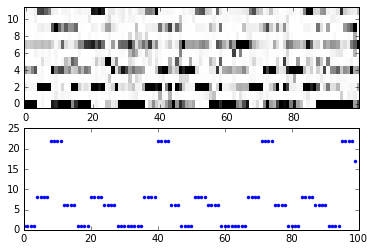

In [12]:
# Plot the chroma matrix "spectrogram-style", and show how the labels 
# line up.
plt.subplot(211)
my_imshow(chroma[:100, :].transpose())
plt.subplot(212)
plt.plot(labels[:100], '.')

In [8]:
# Resynthesize chroma feature matrices to audio with Shepard tones.
sr = 16000
y = mir_eval.sonify.chroma(chroma.transpose(), beat_times, sr)
IPython.display.Audio(data=y, rate=sr)

In [75]:
def train_chord_models(train_ids):
    """Train Gaussian models for all chord data from a list of IDs.
    
    Args:
      train_ids:  List of IDs to pass to read_beat_chroma_labels().

    Returns:
      models: a list of sklearn.mixture.GMM objects, one for each class.
      transitions: np.array of size (num_classes, num_classes). 
        transitions[i, j] is the probability of moving to state j when 
        starting in state i.
      priors: 1D np.array giving the prior probability for each class.

    2016-04-03, 2010-04-07 Dan Ellis dpwe@ee.columbia.edu
    """
    # Load all the features and labels into one big array.
    features = []
    labels = []
    for train_id in train_ids:
        beat_times, chroma, label = read_beat_chroma_labels(train_id)
        features.append(chroma)
        labels.append(label)
    features = np.concatenate(features)
    labels = np.concatenate(labels)
    print('Training features shape:', features.shape)
    num_chroma = 12
    # We have a major and a minor chord model for each chroma, plus NOCHORD.
    num_models = 2 * num_chroma + 1
    # Global mean/covariance used for empty models.
    global_model = sklearn.mixture.GMM(n_components=1, 
                                       covariance_type='full')
    # Train a background model on all the data, regardless of label.
    global_model.fit(features)
    # Set up individual models for all chords.
    models = []
    for model_index in xrange(num_models):
        # labels contains one value in the range 0..24 for each row of 
        # features.
        true_example_rows = np.nonzero(labels == model_index)
        if true_example_rows:
            model = sklearn.mixture.GMM(n_components=1, 
                                        covariance_type='full')
            model.fit(features[true_example_rows])
            models.append(model)
        else:
            # No training data for this label, so substitute the 
            # background model.
            models.append(global_model)
    # Count the number of transitions in the label set.
    # Each element of gtt is a 4 digit number indicating one transition 
    # e.g. 2400 for 24 -> 0.
    hashed_transitions = 100*labels[:-1] + labels[1:]
    # Arrange these into the transition matrix by counting each type.
    transitions = np.zeros((num_models, num_models))
    for i in xrange(num_models):
        for j in xrange(num_models):
            transition_hash = 100 * i + j 
            # Add one to all counts, so no transitions have zero 
            # probability.
            transitions[i, j] = 1 + np.count_nonzero(hashed_transitions == 
                                                     transition_hash)
    # Priors of each chord = total count of pairs starting in that chord.
    priors = np.sum(transitions, axis=1)
    # Normalize each row of transitions.
    transitions /= priors[:, np.newaxis]
    # Normalize priors too.
    priors /= np.sum(priors)
    
    return models, transitions, priors

Training features shape: (65355, 12)


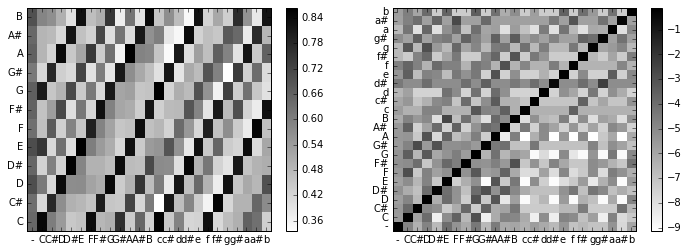

In [76]:
# Run the full set of training examples through the model training.
models, transitions, priors = train_chord_models(train_files)
# Extract the means from each class's model to illustrate.
model_means = np.concatenate([model.means_ for model in models])
# Construct a list of names for each of the 25 classes.
all_chords = ['-', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 
              'B', 'c', 'c#', 'd', 'd#', 'e', 'f', 'f#', 'g', 'g#', 'a', 'a#', 'b']

plt.figure(figsize=(12,4))
plt.subplot(121)
my_imshow(model_means.transpose())
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(12), all_chords[1:13])
plt.subplot(122)
my_imshow(np.log(transitions))
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.colorbar()

In [15]:
def viterbi_path(posteriors, transitions, priors):
    """Calculate Viterbi (best-cost) path through Markov model.
    
    Args:
      posteriors: np.array sized (num_frames, num_states) giving the 
        local-match posterior probability of being in state j at time i.
      transitions: np.array of (num_states, num_states).  For each row, 
        transitions(row, col) gives the probability of transitioning from
        state row to state col.
      priors: np.array of (num_states,) giving prior probability of 
        each state.    
    """
    num_frames, num_states = posteriors.shape
    traceback = np.zeros((num_frames, num_states), dtype=int)
    # Normalized best probability-to-date for each state.
    best_prob = priors * posteriors[0]
    best_prob /= np.sum(best_prob)
    for frame in xrange(1, num_frames):
        # Find most likely combination of previous prob-to-path, and 
        # transition.
        possible_transition_scores = (transitions * 
                                      np.outer(best_prob, posteriors[frame]))
        # The max is found for each destination state (column), so the max
        # is over all the possible preceding states (rows).
        traceback[frame] = np.argmax(possible_transition_scores, axis=0)
        best_prob = np.max(possible_transition_scores, axis=0)
        best_prob /= np.sum(best_prob)
    # Traceback from best final state to get best path.
    path = np.zeros(num_frames, dtype=int)
    path[-1] = np.argmax(best_prob)
    for frame in xrange(num_frames - 1, 0, -1):
        path[frame - 1] = traceback[frame, path[frame]]
    return path

def recognize_chords(chroma, models, transitions, priors):
    """Perform chord recognition on chroma feature matrix."""
    scores = np.array([model.score(chroma) for model in models])
    chords = viterbi_path(np.exp(scores.transpose()), transitions, priors)
    return chords, scores

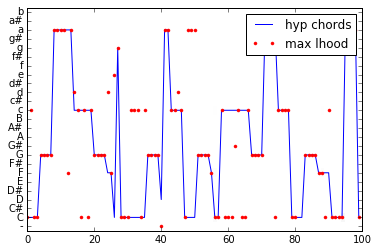

In [43]:
# Run chord recognition and plot best path over likelihoods for one track.
hyp_chords, scores = recognize_chords(chroma, models, transitions, priors)
max_time = 100
my_imshow(np.exp(scores[:, :max_time]), clim=[0, 200])
plt.plot(hyp_chords[:max_time], label='hyp chords')
plt.yticks(np.arange(25), all_chords)
# Compare to most-likely chord at each time.
most_likely = np.argmax(scores, axis=0)
plt.plot(most_likely[:max_time], '.r', label='max lhood')
plt.xlim(0, max_time)
plt.legend()

In [18]:
# We read the true labels when we read in the features.
true_chords = labels
print("true_chords shape:", true_chords.shape)
print("hyp_chords correct: {:.1f}%".format(100 * np.mean(true_chords == 
                                                         hyp_chords)))
print("max lhood chords correct: {:.1f}%".format(100 * np.mean(true_chords == 
                                                               most_likely)))

true_chords shape: (555,)
hyp_chords correct: 71.4%
max lhood chords correct: 45.9%


Chords correct: 71.4%


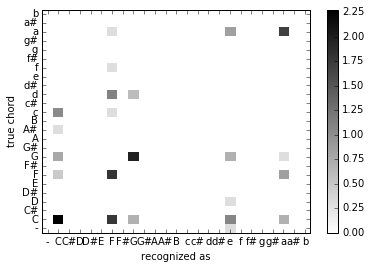

In [19]:
# Helper function to score one track.
def score_chord_recognition(hyp_chords, true_chords):
    """Calculate confusion matrix and return accuracy."""
    num_labels = 25
    confusions = sklearn.metrics.confusion_matrix(hyp_chords, true_chords, 
                                                  labels=np.arange(num_labels))
    score = np.sum(np.diag(confusions)) / float(np.sum(confusions))
    return score, confusions

score, confusions = score_chord_recognition(hyp_chords, true_chords)
print("Chords correct: {:.1f}%".format(100 * score))

my_imshow(np.log10(np.maximum(1, confusions)))
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.xlabel('recognized as')
plt.ylabel('true chord')

In [21]:
def labels_to_chroma(labels):
    """Generate canonical chroma patterns from chord labels."""
    num_labels= len(labels)
    num_chroma = 12
    chroma = np.zeros((num_labels, num_chroma))
    for frame, label in enumerate(labels):
        if label > 12:
            # minor chord.
            chroma[frame, np.mod(np.array([0, 3, 7]) + (label - 13), 12)] = 1
        elif label > 0:
            # major chord.
            chroma[frame, np.mod(np.array([0, 4, 7]) + (label - 1), 12)] = 1
    return chroma

# Sonify the canonical chords corresponding to the system output.
y = mir_eval.sonify.chroma(labels_to_chroma(hyp_chords).transpose(), beat_times, sr)
IPython.display.Audio(data=y, rate=sr)

NameError: name 'times' is not defined

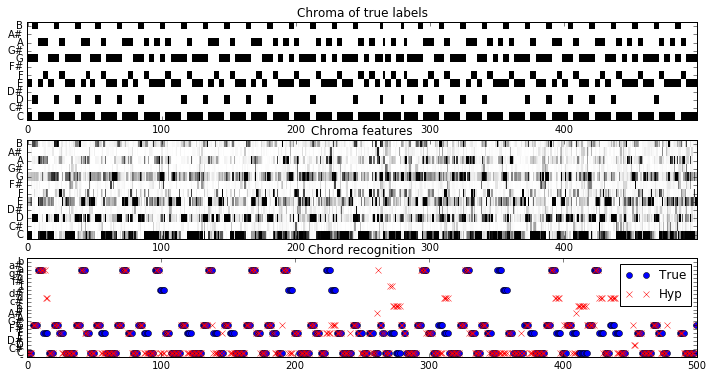

In [22]:
# Compare ideal chroma, actual chroma, and recognized and true chord labels.
max_time = 500
plt.figure(figsize=(12,6))
plt.subplot(311)
my_imshow(labels_to_chroma(true_chords[:max_time]).transpose())
plt.yticks(np.arange(12), all_chords[1:13])
plt.title('Chroma of true labels')
plt.subplot(312)
my_imshow(chroma[:max_time].transpose())
plt.yticks(np.arange(12), all_chords[1:13])
plt.title('Chroma features')
plt.subplot(313)
plt.plot(true_chords[:max_time], 'ob', label='True')
plt.plot(hyp_chords[:max_time], 'xr', label='Hyp')
plt.yticks(np.arange(25), all_chords)
plt.legend()
plt.title('Chord recognition')

Overall recognition accuracy = 75.7%


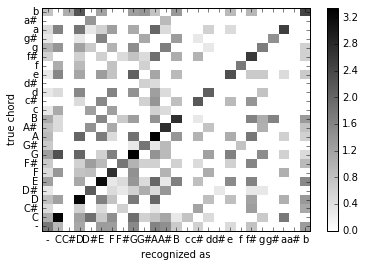

In [77]:
# Code to evaluate over a whole test set.

def test_chord_models(test_files, models, transitions, priors):
    """"Test chord recognizer on multiple tracks."""
    # Total # labels = Total # models = {major,minor} x {all chroma} + NOCHORD.
    num_chroma = 12
    num_labels = 2 * num_chroma + 1
    NOCHORD = 0
    # Initialize confusion matrix.
    all_confusions = np.zeros((num_labels, num_labels))
    # Run recognition on each file individually.
    for file_id in test_files:
        _, chroma, true_labels = read_beat_chroma_labels(file_id)
        hyp_labels, _ = recognize_chords(chroma, models, transitions, 
                                         priors)
        score, confusions = score_chord_recognition(hyp_labels, 
                                                    true_labels)
        all_confusions += confusions
    # Exclude regions where both streams report No Chord (e.g. lead
    # in/lead out)
    true_nothing_count = all_confusions[NOCHORD, NOCHORD]
    all_score = ((np.sum(np.diag(all_confusions)) - true_nothing_count) / 
                 (np.sum(all_confusions) - true_nothing_count))
    print('Overall recognition accuracy = {:.1f}%'.format(100 * all_score))
    return all_score, all_confusions

# Read in the list of test IDs (all different from the train IDs)
test_files = read_file_list(os.path.join(DATA_PATH, 'testfilelist.txt'))
# Evaluate chord recognition over the whole set.
score, confusions = test_chord_models(test_files, models, transitions, priors)
# Matlab chroma_if: 58.4%
# Matlab + 0.25 compression: 75.7%
# librosa chroma_stft: 53.7%
# librosa chroma_stft + HPSS: ?% (forgot to retrain)
# librosa chroma_cqt + HPSS: 70.1%
# + 0.25 compression: 75.4%

# Plot overall confusion matrix.
my_imshow(np.log10(np.maximum(1, confusions)))
plt.colorbar()
plt.xticks(np.arange(25), all_chords)
plt.yticks(np.arange(25), all_chords)
plt.xlabel('recognized as')
plt.ylabel('true chord')

In [66]:
import cPickle as pickle

DATA_DIR = '/Users/dpwe/Downloads/prac10/data'

def read_beat_chroma_labels(file_id):
    """Read back a precomputed beat-synchronous chroma record."""
    filename = os.path.join(os.path.join(DATA_DIR, 'beatchromlabs', file_id + '.pkl'))
    with open(filename, "r") as f:
        beat_times, chroma_features, label_indices = pickle.load(f)
    chroma_features = chroma_features**0.25
    chroma_features /= np.max(chroma_features, axis=1)[:, np.newaxis]
    return beat_times, chroma_features, label_indices

beat_times, chroma_features, label_indices = read_beat_chroma_labels(train_files[134])
print(beat_times.shape, chroma_features.shape, label_indices.shape)

(553,) (553, 12) (553,)
